# **⚡ " Implementasi Algoritma Klasifikasi dalam Memprediksi Performa Penjualan Produk Lemari pada *E-Commerce Shopee* "**   

## ***-Final Team Project Data Mining I-***


⛅**KELAS SD-A2**

🌘**KELOMPOK 13**
1. Alvina Nur Aulia                (162012133006
2. Elfira Rahma Putri              (162012133010)
3. Muhammad Reza Erfit             (162012133024)

**Program Studi S1 Teknologi Sains Data Fakultas Teknologi Maju dan Multidisiplin Universitas Airlangga 2022**

---

# **A. Import Package dan Dataset** 

## **1. Deskripsi Dataset**

***Shopeesold Dataset*** merupakan kumpulan data scrapping produk lemari yang berasal dari e-commerce Shopee. Ketika user memasukkan kata kunci "lemari", maka berbagai produk lemari akan muncul disertai dengan informasi rating star, produk yang telah terjual, lokasi toko, dll. Dataset ini terdiri dari **5589 *instance*** dengan **15 variabel** pengamatan.

Berikut adalah link dari dataset yang kami gunakan https://drive.google.com/file/d/1mCThfvCTvQBd_XamOilFnyWhSOzu5uCo/view?usp=sharing 



## **2. Deskripsi Atribut**

       🌘 VARIABEL KUALITATIF 
       1. itemid : [Nominal] ID produk lemari
       2. shopid : [Nominal] ID toko 
       3. name : [Nominal] Nama produk lemari
       4. show_free_shipping : [Nominal] Apakah terdapat promo gratis ongkos kirim (1:True, 0:False)
       5. is_preferred_plus_seller : [Nominal] Apakah termasuk plus seller (1:True, 0:False)
       6. shop_location : [Nominal] Lokasi toko penjualan (1:Pulau Jawa, 0:Luar Pulau Jawa)
       7. can_use_cod : [Nominal] Apakah dapat menggunakan sistem COD (Cash on Delivery) (1:True, 0:False)
       8. is_on_flash_sale: [Nominal] Apakah termasuk pada produk flash sale (1:True, 0:False)

       🌘 VARIABEL KUANTITATIF 
       1. stock : [Rasio] Jumlah stok produk yang tersisa
       2. historical_sold : [Rasio] Jumlah produk yang telah terjual ✨TARGET VARIABEL✨ 
       *(akan dibagi menjadi tiga kelas dan dilakukan proses encode 0 (Kurang Laris) 1(Cukup Laris) 2(Sangat Laris) 
       3. liked_count : [Rasio] Jumlah like dari produk
       4. rating_total : [Rasio] Jumlah user yang memberikan rating atau penilaian pada produk
       5. price : [Rasio] Harga dari produk lemari
       6. raw_discount : [Rasio] Jumlah diskon produk yang diberikan
       7. rating_star : [Rasio] Jumlah rating star atau penilaian dari pelanggan(0-5)


In [72]:
#Import package yang akan digunakan
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score, plot_confusion_matrix

In [73]:
#Memanggil dataset yang akan digunakan
df = pd.read_csv("shopeesold2.csv")
df

,itemid,shopid,name,stock,historical_sold,liked_count,rating_total,price,raw_discount,rating_star,show_free_shipping,is_preferred_plus_seller,shop_location,can_use_cod,is_on_flash_sale
0,6707296397,107393389,Papan ambalan rak dinding kayu Lebar 12 cm 60-...,10337163,29435,27884,11904,1.150000e+09,41,4.780560,False,False,1,True,False
1,6707296397,107393389,Papan ambalan rak dinding kayu Lebar 12 cm 60-...,10337163,29435,27884,11904,1.150000e+09,41,4.780560,False,False,1,True,False
2,11744595143,474022307,Storage Box 2in1 Box Organizer Tempat Penyimpa...,1699,27237,11902,9490,2.980000e+09,75,4.897039,False,True,1,True,False
3,11744595143,474022307,Storage Box 2in1 Box Organizer Tempat Penyimpa...,1699,27237,11902,9490,2.980000e+09,75,4.897039,False,True,1,True,False
4,1814275720,46457770,Lemari Pakaian Portable Rak Serbaguna Organize...,444,24102,66431,14106,1.699000e+10,43,4.772318,True,False,1,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5584,1897539189,31210460,Kirana Lemari Pakaian 2 Pintu Sliding Wardrobe...,48,1532,20512,793,1.700000e+11,0,4.809584,False,False,1,False,False
5585,7446597915,282909810,Lemari Plastik Portable 6 Pintu lemari Portabl...,139627,1527,918,773,1.490000e+10,26,4.715395,False,False,1,True,False
5586,7446597915,282909810,Lemari Plastik Portable 6 Pintu lemari Portabl...,139627,1527,917,772,1.490000e+10,26,4.715026,False,False,1,True,False
5587,5842659532,263081004,LEMARI PLASTIK CLUB TRIPLE FLIP 3 SUSUN,997,1524,13307,841,4.697000e+10,0,4.914388,False,False,1,False,False


## **3. Analaisis Ukuran Pemusatan dan Penyebaran Data**

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5589 entries, 0 to 5588
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   itemid                    5589 non-null   int64  
 1   shopid                    5589 non-null   int64  
 2   name                      5589 non-null   object 
 3   stock                     5589 non-null   int64  
 4   historical_sold           5589 non-null   int64  
 5   liked_count               5589 non-null   int64  
 6   rating_total              5589 non-null   int64  
 7   price                     5589 non-null   float64
 8   raw_discount              5589 non-null   int64  
 9   rating_star               5589 non-null   float64
 10  show_free_shipping        5589 non-null   bool   
 11  is_preferred_plus_seller  5589 non-null   bool   
 12  shop_location             5589 non-null   int64  
 13  can_use_cod               5589 non-null   bool   
 14  is_on_fl

In [75]:
print(df.keys())

Index(['itemid', 'shopid', 'name', 'stock', 'historical_sold', 'liked_count',
       'rating_total', 'price', 'raw_discount', 'rating_star',
       'show_free_shipping', 'is_preferred_plus_seller', 'shop_location',
       'can_use_cod', 'is_on_flash_sale'],
      dtype='object')


In [76]:
#Statistika deskriptif variabel numerik
dfnumeric = df[['stock','historical_sold', 'liked_count','price', 'raw_discount','rating_total','rating_star']]
dfnumeric.describe()

,stock,historical_sold,liked_count,price,raw_discount,rating_total,rating_star
count,5.589000e+03,5589.000000,5589.000000,5.589000e+03,5589.000000,5589.000000,5589.000000
mean,1.354483e+04,869.375738,1843.979961,5.853808e+10,7.913759,445.517087,4.716218
std,2.151718e+05,2357.611207,5404.543472,7.106646e+10,16.105895,1200.645474,0.540599
min,1.000000e+00,0.000000,0.000000,1.100000e+08,0.000000,0.000000,0.000000
25%,1.500000e+01,15.000000,48.000000,2.100000e+10,0.000000,8.000000,4.662420
50%,9.300000e+01,72.000000,183.000000,3.600000e+10,0.000000,39.000000,4.802469
75%,6.250000e+02,394.000000,918.000000,6.500000e+10,5.000000,191.000000,4.929577
max,1.033716e+07,29435.000000,75110.000000,9.500000e+11,89.000000,14106.000000,5.000000


In [77]:
#Statistika deskriptif variabel kategorial
dfcategoric = df[['name', 'show_free_shipping','is_preferred_plus_seller', 'can_use_cod','is_on_flash_sale']]
dfcategoric.describe()

,name,show_free_shipping,is_preferred_plus_seller,can_use_cod,is_on_flash_sale
count,5589,5589,5589,5589,5589
unique,2929,2,2,2,2
top,FULL KUNCI LEMARI PAKAIAN PLASTIK FULL KUNCI 2...,False,False,False,False
freq,11,4358,5041,4044,5579


# **B. Data Pre-Processing dan Exploratory Data Analysis**

##**B.1 Data Cleaning**

### **1. Identifikasi Outliers**

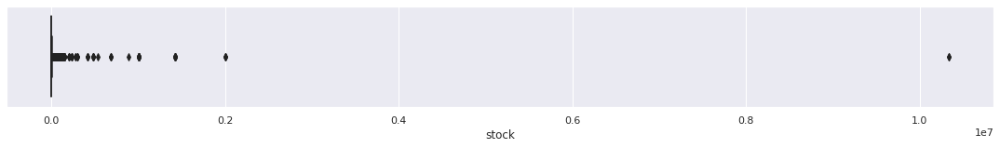

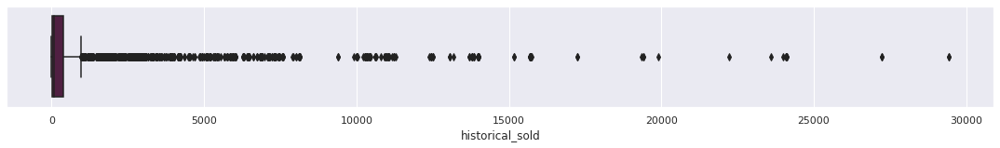

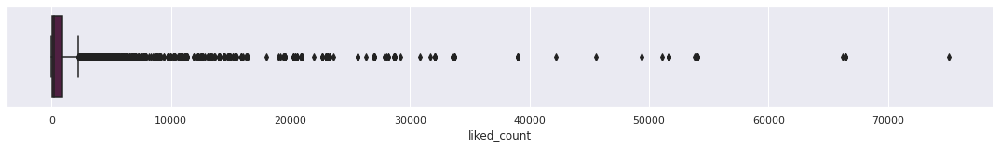

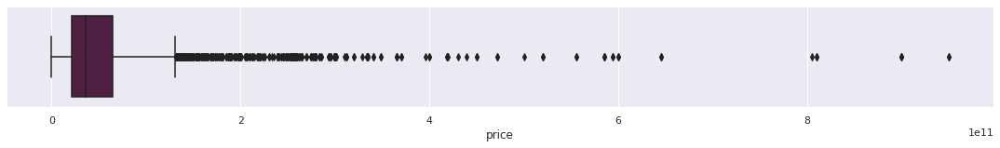

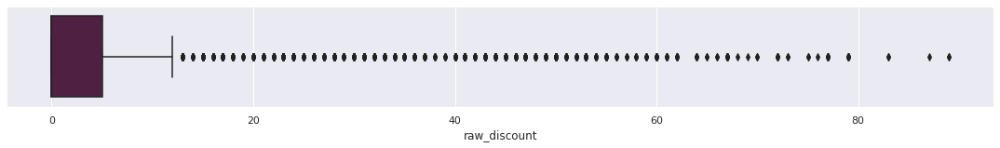

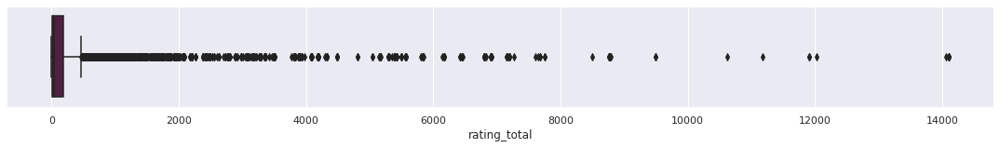

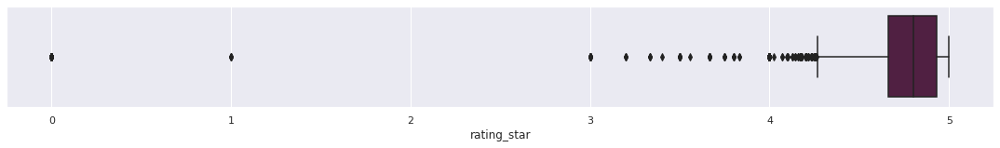

In [78]:
#Cek outlier dengan visualisasi boxplot

dfnum=df[['stock','historical_sold', 'liked_count','price', 'raw_discount','rating_total','rating_star']] #exclude object-type columns
for column in dfnum:
    plt.figure(figsize=(19,2))
    sns.boxplot(data=df, x=column,color="#581845")


**INTERPRETASI**


> 1. Dari visualisasi boxplot diatas, dapat diketahui bahwa **semua variabel kuantitatif memiliki nilai outlier,** bahkan terhitung sangat ekstim. Karena pada tahap awal ini kami belum memiliki informasi yang pasti mengenai data outlier tersebut, maka kami memutuskan untuk tidak menghapus outlier tersebut. Karena penghapusan nilai outlier memungkinkan untuk hilangnya informasi yang cukup penting dalam proses pembangunan model klasifikasi. 
2. Pada tahap ini, terlebih dahulu kami fokus melihat rentang data yang cukup jauh dari **variabel target (historical_sold)**. Karena pada tahap selanjutnya, varaiabel target tersebut akan dibagi menjadi **tiga kelompok** (Kurang Laris, Cukup Laris, dan Sangat Laris), maka pemangkasan outlier perlu dilakukan agar proses pembagian rentang tiap kelompok tidak terlalu jauh







In [79]:
#Range yang sangat jauh pada variabel target
print("Nilai minimum historical_sold :",min(df['historical_sold']))
print("Nilai maksimum historical_sold :",max(df['historical_sold']))

Nilai minimum historical_sold : 0
Nilai maksimum historical_sold : 29435


In [80]:
#Remove outlier dari variabel target menggunakan Z score
from scipy import stats
import numpy as np
 
z = np.abs(stats.zscore(df['historical_sold']))
threshold = 3
#print(np.where(z > 3)) #letak outlier
df = df.drop(df.index[z>3])
print(df.shape)

(5464, 15)


### **2. Identifikasi Missing Value**

In [81]:
df.isnull().sum()

itemid                      0
shopid                      0
name                        0
stock                       0
historical_sold             0
liked_count                 0
rating_total                0
price                       0
raw_discount                0
rating_star                 0
show_free_shipping          0
is_preferred_plus_seller    0
shop_location               0
can_use_cod                 0
is_on_flash_sale            0
dtype: int64

**INTERPRETASI**

> Dari 15 atribut yang akan dianalisis didapatkan hasil bahwa tidak ada missing value yang ditemukan. Sehingga, tidak perlu dilakukan imputasi dan dapat lanjut ke tahapan permodelan selanjutnya



##**B.2 Data Reduction**

In [82]:
df = df.sort_values(by='historical_sold')
df.tail()

,itemid,shopid,name,stock,historical_sold,liked_count,rating_total,price,raw_discount,rating_star,show_free_shipping,is_preferred_plus_seller,shop_location,can_use_cod,is_on_flash_sale
129,64424023,4121801,Lemari Baju lemari Pakaian Lemari Plastik Lema...,3702,7583,20238,4493,2.200000e+10,0,4.737147,True,False,1,False,False
127,64424023,4121801,Lemari Baju lemari Pakaian Lemari Plastik Lema...,3702,7585,20235,4493,2.200000e+10,0,4.737147,True,False,1,False,False
128,64424023,4121801,Lemari Baju lemari Pakaian Lemari Plastik Lema...,3702,7585,20238,4493,2.200000e+10,0,4.737147,True,False,1,False,False
126,8516304986,310999782,Lemari Portable Lemari Serbaguna Lemari Kain R...,14715,7904,3475,3973,9.960000e+09,53,4.619864,False,False,1,True,False
125,9773619497,105034258,FULL KUNCI LEMARI PAKAIAN PLASTIK FULL KUNCI 3...,1032,7941,3946,3900,1.770000e+10,65,4.609355,False,False,1,False,False


In [83]:
#Drop record yang duplikat dalam dataset (redundant data)
df = df.drop_duplicates(keep='first')
print(df.shape)

(3401, 15)


In [84]:
#Drop atribut yang tidak relevan dengan model yang akan dibangun
df = df.drop(['itemid', 'shopid', 'name'], axis = 1)
df.head()

,stock,historical_sold,liked_count,rating_total,price,raw_discount,rating_star,show_free_shipping,is_preferred_plus_seller,shop_location,can_use_cod,is_on_flash_sale
5331,20,0,10,0,3.410000e+11,0,0.0,False,False,1,False,False
5326,295,0,0,0,8.000000e+09,0,0.0,False,False,1,False,False
5327,9999,0,0,0,1.000000e+10,50,0.0,False,False,1,False,False
5328,200,0,1,0,1.837000e+10,27,0.0,False,False,1,False,True
5330,200,0,2,0,2.190000e+10,27,0.0,False,False,1,False,False


**INTERPRETASI**



> Kedua step diatas merupakan tahapan awal dari ***feature subset selection***. Hal tersebut perlu dilakukan untuk reduksi dimensi dari dataset asli. Langkah yang dapat dilakukan yakni :
1. **Menghapus data redundan**, yakni data yang duplikat dalam dataset. Setelah dilakukan penghapusan, dari 4999 record produk berkurang menjadi 2923 record produk
2. **Menghapus atribut yang irrelevant**, yakni atribut yang tidak relevan dengan model yang akan dibangun. Pada dataset shopeesold, terdapat beberapa atribut yang irrelevant seperti data berupa ID dan name yang menunjukkan identitas dari tiap produk, sehingga tidak diperlukan dalam melakukan pemodelan







##**B.3 Data Transformation**

### **1. Encoding Variabel Kualitatif *(non-target variabel)***

In [85]:
#Encoding variabel kualitatif yang memiliki nilai boolean (FALSE/TRUE)
from sklearn import preprocessing
categ = ['show_free_shipping', 'is_preferred_plus_seller', 'can_use_cod', 'is_on_flash_sale']
le = preprocessing.LabelEncoder()
df[categ] = df[categ].apply(le.fit_transform)
df

,stock,historical_sold,liked_count,rating_total,price,raw_discount,rating_star,show_free_shipping,is_preferred_plus_seller,shop_location,can_use_cod,is_on_flash_sale
5331,20,0,10,0,3.410000e+11,0,0.000000,0,0,1,0,0
5326,295,0,0,0,8.000000e+09,0,0.000000,0,0,1,0,0
5327,9999,0,0,0,1.000000e+10,50,0.000000,0,0,1,0,0
5328,200,0,1,0,1.837000e+10,27,0.000000,0,0,1,0,1
5330,200,0,2,0,2.190000e+10,27,0.000000,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
129,3702,7583,20238,4493,2.200000e+10,0,4.737147,1,0,1,0,0
127,3702,7585,20235,4493,2.200000e+10,0,4.737147,1,0,1,0,0
128,3702,7585,20238,4493,2.200000e+10,0,4.737147,1,0,1,0,0
126,14715,7904,3475,3973,9.960000e+09,53,4.619864,0,0,1,1,0


**INTERPRETASI**

> Sebagian besar algoritma dalam *machine learning* bekerja lebih optimal ketika variabel merupakan input numerik. Oleh karena itu, dilakukan pengkodean dengan menggunakan metode **Label Encorder**. Sehingga nilai boolean yang ada pada dataset asli (TRUE/FALSE) akan diubah menjadi angka (1/0)



### **2. Encoding Variabel Kualitatif *(target variabel)***

In [86]:
#Melihat pesebaran dari jumlah tiap unique value pada variabel target
a = df['historical_sold'].value_counts()
b = pd.DataFrame(a).sort_values(by="historical_sold")
b.tail(10)

,historical_sold
8,39
10,40
11,42
9,42
7,59
6,69
5,75
4,98
3,106
2,110


**INTERPRETASI**

Dari dataframe diatas, dapat diketahui bahwa mayoritas data dari variabel target (historical_sold) berada pada rentang 2 hingga 11 produk yang terjual 

In [87]:
#Binning variabel target menjadi tiga kelas
#Membagi data variabel target yang sudah diurutkan dari min ke max menjadi 3 bins (Kurang Laris, Cukup Laris, Sangat Laris)
pd.cut(df['historical_sold'], bins=3)
pd.cut(df['historical_sold'], bins=3).value_counts()

(-7.941, 2647.0]    3063
(2647.0, 5294.0]     221
(5294.0, 7941.0]     117
Name: historical_sold, dtype: int64

**INTERPRETASI**

> 1. Pembagian kelas menggunakan metode **binning**, yakni membagi data yang telah diurutkan menjadi beberapa bagian kelas. **Pd.cut** melakukan pembagian data dengan cara menyamakan rentang untuk tiap kelas, sehingga tidak ada perbedaan rentang antara kelas pertama, kedua, dan ketiga
2. Ukuran diatas merupakan pembagian rentang data historical_sold menjadi tiga kelas yang berbeda. Walaupun pada tahap awal sudah dilakukan penghapusan outlier yang ekstrim pada variabel historical_sold, namun dari hasil pembagian data diatas, didapatkan adanya **kelas yang sangat imbalance.** Pada kelas pertama terdapat 3063 data. Kelas pertama memiliki jumlah yang data yang sangat berbeda dengan kelas kedua dan kelas ketiga. 
Untuk meminimalisir data yang imbalanced, maka dilakukan proses **transformasi cube root pada variabel target (historical_sold)**



In [88]:
#Melakukan transformasi pada variabel target
df['historical_sold'] = np.cbrt(df['historical_sold'])

In [89]:
#Membagi data variabel target yang telah ditranformasikan menjadi 3 bins (Kurang Laris, Cukup Laris, Sangat Laris)
pd.cut(df['historical_sold'], bins=3)
pd.cut(df['historical_sold'], bins=3).value_counts()

(-0.02, 6.65]     2362
(6.65, 13.3]       661
(13.3, 19.951]     378
Name: historical_sold, dtype: int64

**INTERPRETASI**

> 1. **Cube Root Transformation** merupakan transformasi nilai pada variabel target y menjadi y dipangkatkan dengan 1/3. 
2. Setelah dilakukan proses transformasi, didapatkan jumlah data pada tiap kelas yang tidak terlalu berbeda dibandingkan dengan sebelum dilakukannya transformasi. Sehingga hasil pada pd.cut diatas digunakan untuk patokan dalam pembagian rentang pada tiap kelas untuk variabel target **(Kurang Laris, Cukup Laris, Sangat Laris)**


In [90]:
#Mendefinisikan label untuk ketiga kelas pada variabel target
bin_labels = ['0Kurang_Laris','1Cukup_Laris','2Sangat_Laris']
df['historical_sold'] = pd.cut(df['historical_sold'], bins=3, labels=bin_labels)
df.head()

,stock,historical_sold,liked_count,rating_total,price,raw_discount,rating_star,show_free_shipping,is_preferred_plus_seller,shop_location,can_use_cod,is_on_flash_sale
5331,20,0Kurang_Laris,10,0,3.410000e+11,0,0.0,0,0,1,0,0
5326,295,0Kurang_Laris,0,0,8.000000e+09,0,0.0,0,0,1,0,0
5327,9999,0Kurang_Laris,0,0,1.000000e+10,50,0.0,0,0,1,0,0
5328,200,0Kurang_Laris,1,0,1.837000e+10,27,0.0,0,0,1,0,1
5330,200,0Kurang_Laris,2,0,2.190000e+10,27,0.0,0,0,1,0,0


In [91]:
#Encode variabel target menjadi bentuk numerik
target = ['historical_sold']
from sklearn import preprocessing
le1 = preprocessing.LabelEncoder()
df[target] = df[target].apply(le1.fit_transform)
df.head()

,stock,historical_sold,liked_count,rating_total,price,raw_discount,rating_star,show_free_shipping,is_preferred_plus_seller,shop_location,can_use_cod,is_on_flash_sale
5331,20,0,10,0,3.410000e+11,0,0.0,0,0,1,0,0
5326,295,0,0,0,8.000000e+09,0,0.0,0,0,1,0,0
5327,9999,0,0,0,1.000000e+10,50,0.0,0,0,1,0,0
5328,200,0,1,0,1.837000e+10,27,0.0,0,0,1,0,1
5330,200,0,2,0,2.190000e+10,27,0.0,0,0,1,0,0


**INTERPRETASI**

Setelah dilakukan encode menggunakan metode label encorder, didapatkan tiga pembagian kelas untuk variabel target (historical_sold), yakni :    
🌵 **Kurang Laris** dilabeli dengan angka 0, terdapat 2362 data

⛅ **Cukup Laris** dilabeli dengan angka 1, terdapat 661 data


🍟 **Sangat Laris** dilabeli dengan angka 2, terdapat 378 data


### **3. Normalisasi Variabel Independen**

**Permasalahan :**

> Adanya skala pengukuran yang berebeda antara variabel numerik dalam dataset berpotensi menyebabkan adanya proses pemodelan yang didominasi oleh variabel dengan skala pengukuran yang lebih tinggi. Contoh : variabel **stock** memiliki rentang pengukuran antara 1 - 1.999.985 satuan, sedangkan variabel **rating_total** memiliki rentang antara 0 - 8496 satuan (memiliki perbedaan skala yang cukup jauh)

**Solusi :**

> Melakukan **normalisasi data**, yakni proses penskalaan data dengan membuat semua elemen atribut numerik terletak pada rentang yang sama, sehingga data yang awalnya memiliki skala yang berbeda diubah menjadi skala yang sama. Hal tersebut bertujuan untuk menjadikan semua variabel memiliki pengaruh yang sama pada model, meningkatkan stabilitas dan kinerja algoritma pemodelan.




In [92]:
# Definisikan variabel dependen(y) dan variabel independen(x)
y = df['historical_sold']
x = df.drop('historical_sold',axis=1) 

#Normalisasi dengan metode Robust Scaling 
scaler = RobustScaler()
x_tr = scaler.fit_transform(x)

**INTERPRETASI**

> Robust Scaling menskalakan setiap variabel dari kumpulan data dengan mengurangkan median dan kemudian membaginya dengan IQR. Alasan pemilihan metode ini adalah memiliki efektivitas kinerja yang lebih baik pada data dengan banyak outlier karena menggunakan statistik yang kuat terhdap outlier (median dan IQR), berbeda dengan metode lain yang menggunakan statistik rentan outlier (maz, min, mean, standard deviation).






In [93]:
# Cek kasus multikolineritas
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(x_tr,i) for i in range(x_tr.shape[1])]
vif['features'] = x.columns
vif

,vif,features
0,1.017183,stock
1,2.192982,liked_count
2,2.449708,rating_total
3,1.051888,price
4,1.357635,raw_discount
5,1.031462,rating_star
6,1.214200,show_free_shipping
7,1.066656,is_preferred_plus_seller
8,1.046243,shop_location
9,1.367432,can_use_cod


**INTERPRETASI**

> Didapatkan nilai VIF dari seluruh variabel indpenden < 10, sehingga dapat dikatakan tidak terjadinya kasus multikolinearitas. Sehingga antar variabel indpenden tidak memiliki korelasi yang kuat antar satu sama lain.


##**B.4 Visualization** 

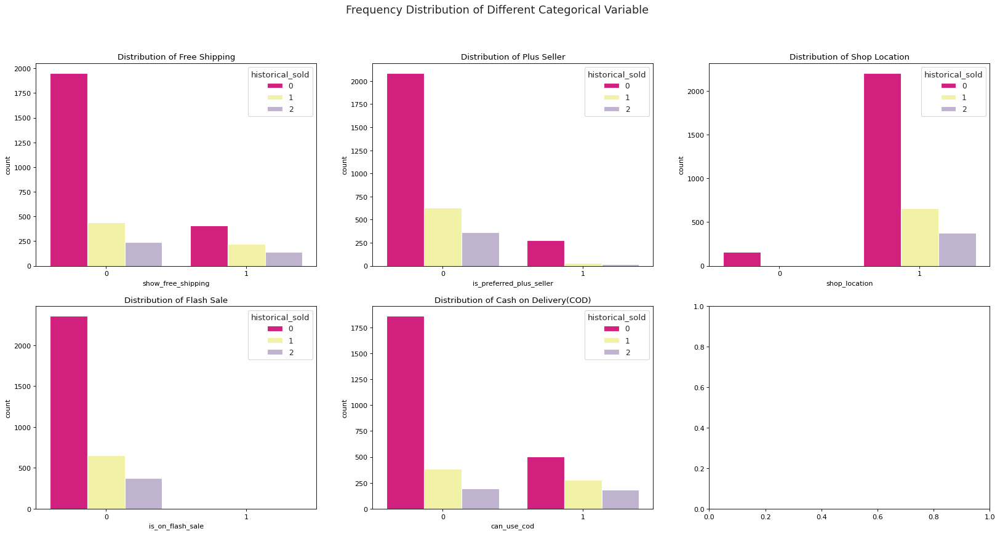

In [23]:
fig, axarr = plt.subplots(2, 3, figsize=(25,12), dpi=80, facecolor='w', edgecolor='k')
sns.set(style="white")
sns.countplot(x='show_free_shipping', hue = 'historical_sold',data = df, ax=axarr[0][0], palette="Accent_r")
axarr[0][0].set_title('Distribution of Free Shipping')
sns.countplot(x='is_preferred_plus_seller', hue = 'historical_sold',data = df, ax=axarr[0][1], palette="Accent_r")
axarr[0][1].set_title('Distribution of Plus Seller')
sns.countplot(x='shop_location', hue = 'historical_sold',data = df, ax=axarr[0][2], palette="Accent_r")
axarr[0][2].set_title('Distribution of Shop Location')
sns.countplot(x='is_on_flash_sale', hue = 'historical_sold',data = df,ax=axarr[1][0], palette="Accent_r")
axarr[1][0].set_title('Distribution of Flash Sale')
sns.countplot(x='can_use_cod', hue = 'historical_sold',data = df,ax=axarr[1][1], palette="Accent_r")
axarr[1][1].set_title('Distribution of Cash on Delivery(COD)')
fig.suptitle('Frequency Distribution of Different Categorical Variable', fontsize=16);

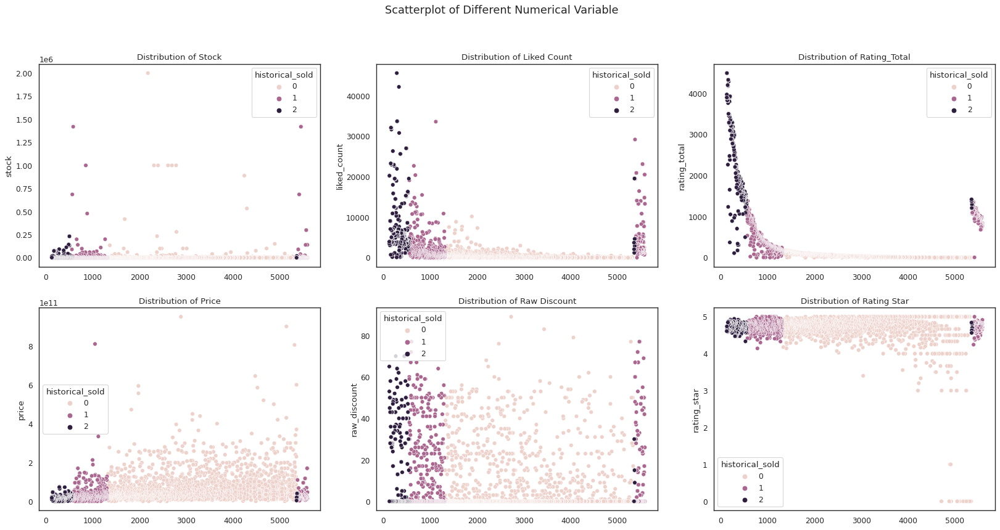

In [ ]:
fig, axarr = plt.subplots(2, 3, figsize=(25,12), dpi=80, facecolor='w', edgecolor='k')
sns.set(style="white")
sns.scatterplot(x=df.index,y=df['stock'],hue=df['historical_sold'],ax=axarr[0][0])
axarr[0][0].set_title('Distribution of Stock')
sns.scatterplot(x=df.index,y=df['liked_count'],hue=df['historical_sold'],ax=axarr[0][1])
axarr[0][1].set_title('Distribution of Liked Count')
sns.scatterplot(x=df.index,y=df['rating_total'],hue=df['historical_sold'],ax=axarr[0][2])
axarr[0][2].set_title('Distribution of Rating_Total')
sns.scatterplot(x=df.index,y=df['price'],hue=df['historical_sold'],ax=axarr[1][0])
axarr[1][0].set_title('Distribution of Price')
sns.scatterplot(x=df.index,y=df['raw_discount'],hue=df['historical_sold'],ax=axarr[1][1])
axarr[1][1].set_title('Distribution of Raw Discount')
sns.scatterplot(x=df.index,y=df['rating_star'],hue=df['historical_sold'],ax=axarr[1][2])
axarr[1][2].set_title('Distribution of Rating Star')
fig.suptitle('Scatterplot of Different Numerical Variable', fontsize=16);

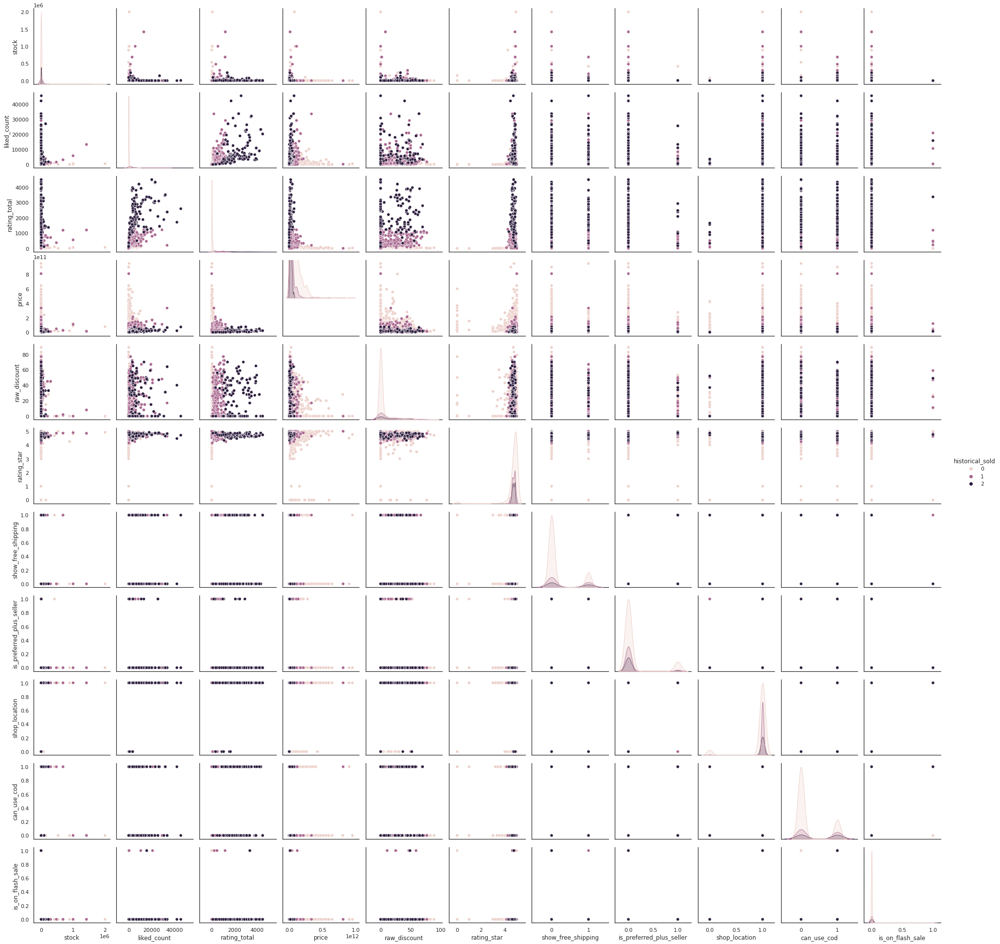

In [ ]:
sns.pairplot(df, hue="historical_sold")

In [ ]:
pip install autoviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 62 kB 969 kB/s 
     |████████████████████████████████| 175 kB 51.7 MB/s 
     |████████████████████████████████| 3.1 MB 41.1 MB/s 
     |████████████████████████████████| 18.5 MB 471 kB/s 
     |████████████████████████████████| 1.7 MB 46.5 MB/s 
     |████████████████████████████████| 12.9 MB 48.1 MB/s 
     |████████████████████████████████| 11.2 MB 50.3 MB/s 
     |████████████████████████████████| 140 kB 63.6 MB/s 
     |████████████████████████████████| 930 kB 57.4 MB/s 
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171046 sha256=24f8e86eea08ae8fe8df8c468fda07e37405bd39ac0071e8a74e43396d96c41a
  Stored in directory: /root/.cache/pip/wheels/8a/4e/b6/57b01db010d17ef6ea9b40300af725ef3e210cb1acfb7ac8b6
Successfully built emoji
  Attempting uninstall: bokeh
    Found existing installation: bokeh 2.3.3
    Uninstalling bokeh-

Alert! from version 0.1.41, after importing, you must do '%matplotlib inline' to display charts in Jupyter Notebooks.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not display plots but saves them in AutoViz_Plots folder in local machine.
Updated: chart_format='bokeh' generates and displays charts in your local Jupyter notebook.
      chart_format='server' generates and displays charts in the browser - one tab for each chart.
      chart_format='html' silently saves charts HTML format - they are also interactive!


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
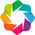

Shape of your Data Set loaded: (3401, 12)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    11 Predictors classified...
        No variables removed since no ID or low-information variables found in data set

################ Multi_Classification problem #####################
Total Number of Scatter Plots = 3
Time to run AutoViz = 29 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


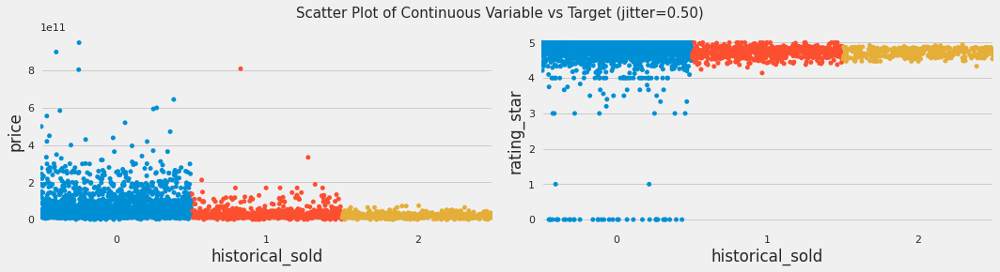

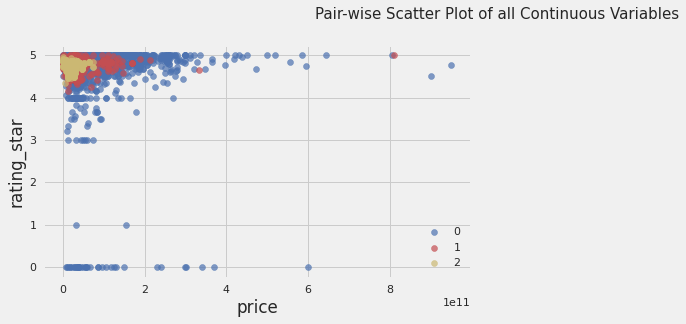

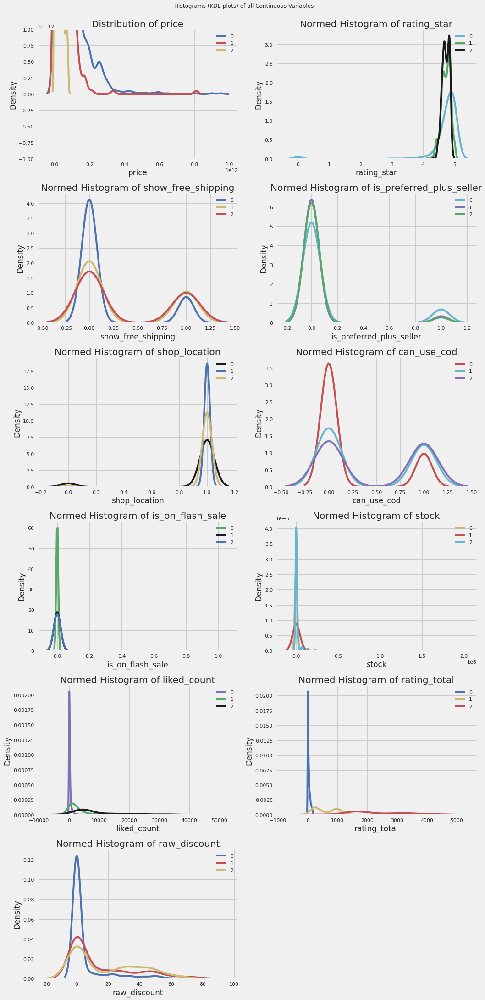

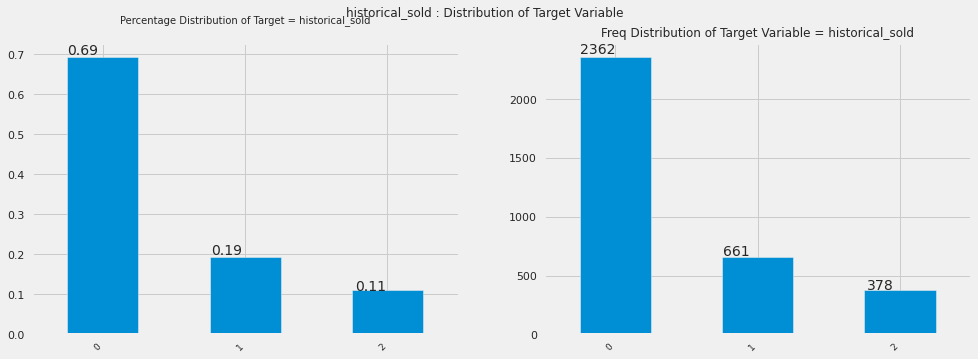

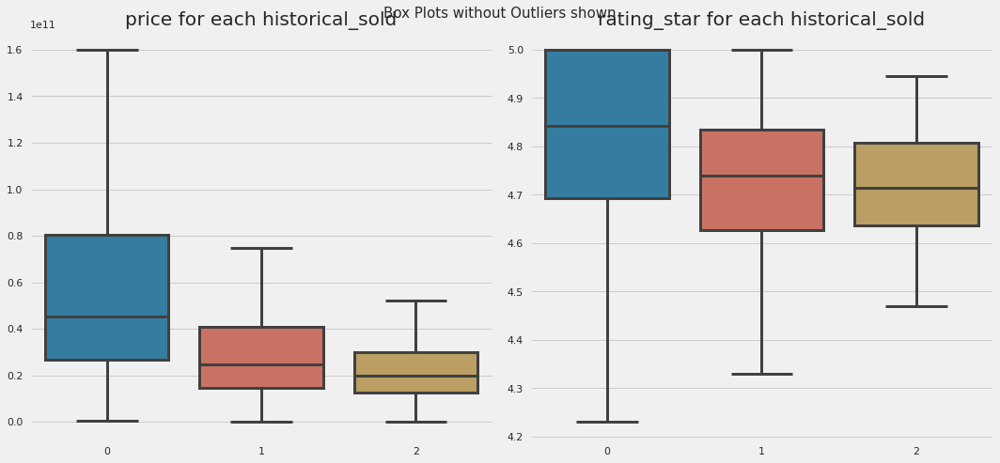

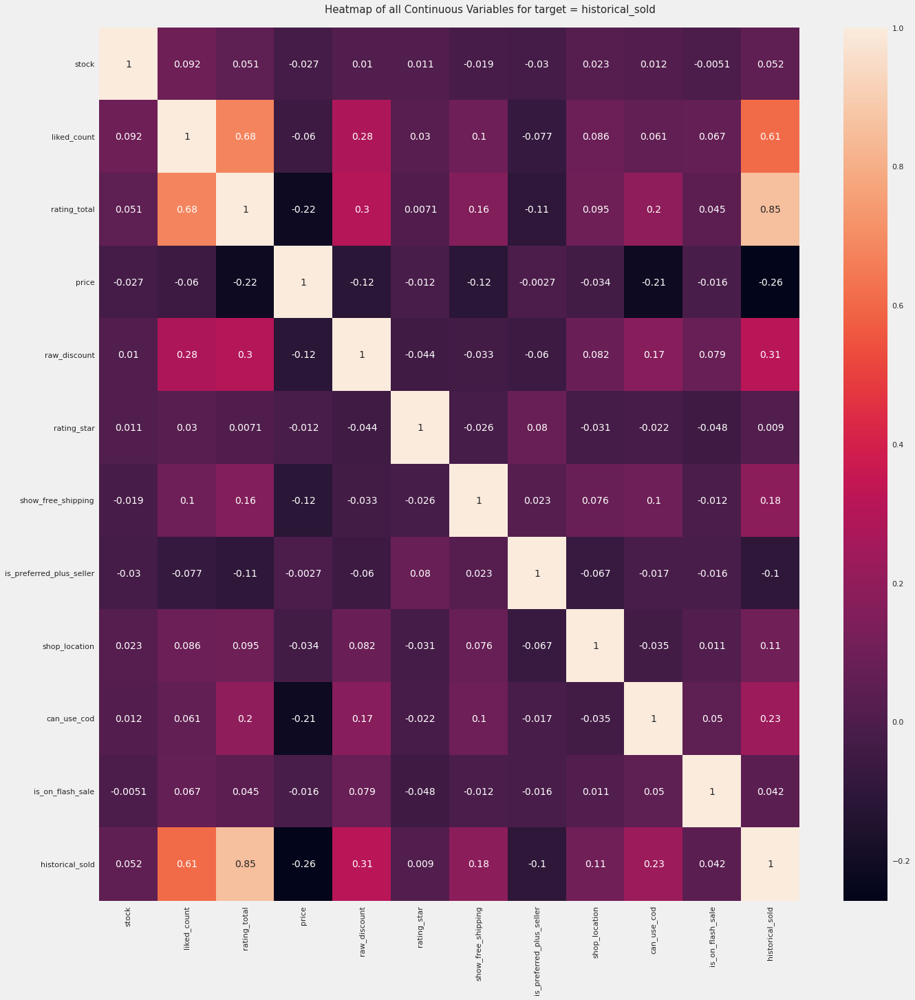

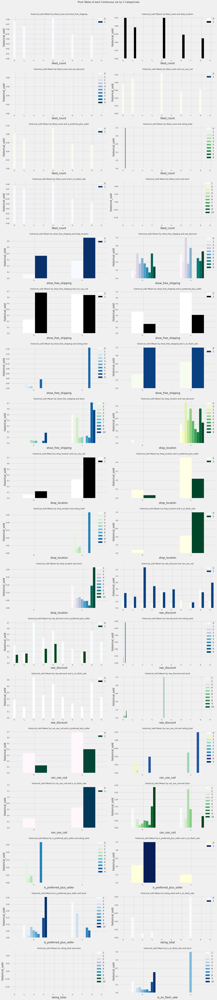

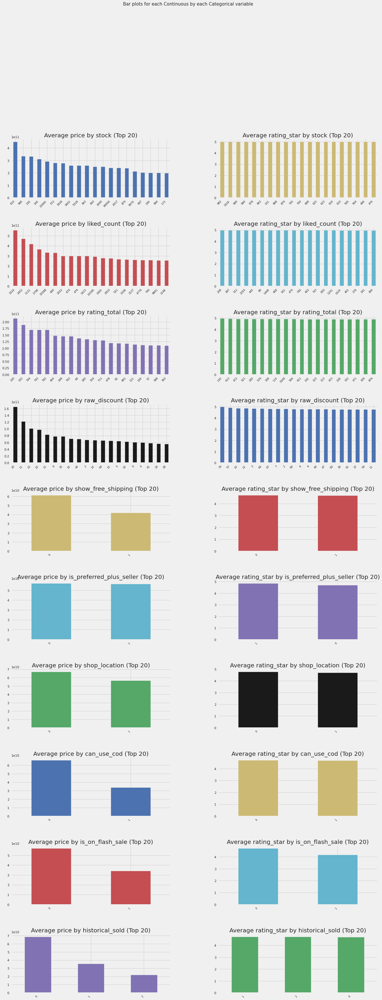

In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
filename = ""
sep = ","
dft = AV.AutoViz(
    filename,
    sep=",",
    depVar="historical_sold",
    dfte=df,
    header=0,
    verbose=0,
    lowess=False,
    chart_format="svg",
    max_rows_analyzed=150000,
    max_cols_analyzed=30,
)

##**B.5 Analisis Korelasi**

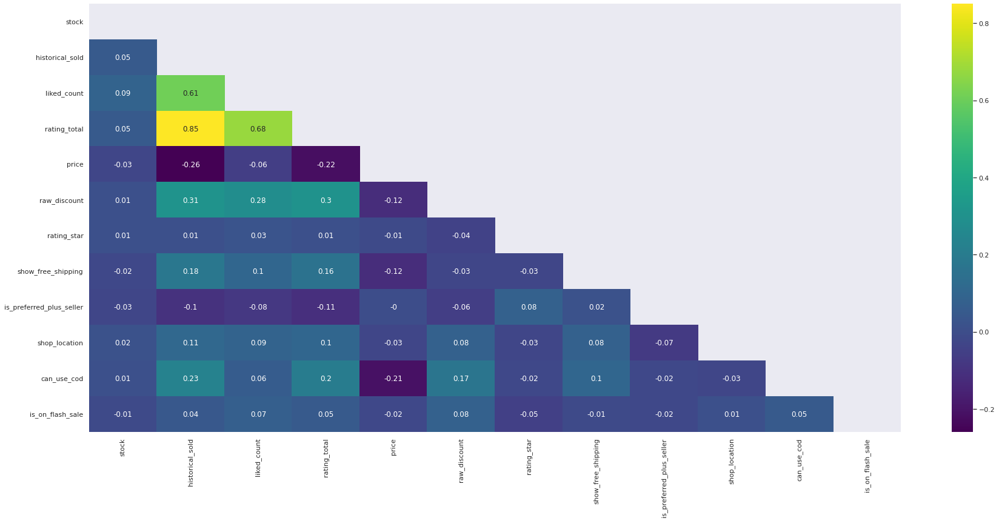

In [49]:
# Analisis korelasi antar variabel dalam dataset
mask = np.triu(np.ones_like(df.corr())) #agar yang muncul segitiga bawah
annot = True #untuk mencetak/ menampilkan nilai korelasi di dalam kotak
sns.set(rc={'figure.figsize':(30,13)}) 
sns.heatmap(df.corr(method='pearson').round(2), annot=True, cmap='viridis', mask=mask)

**INTERPRETASI**

1. Dari nilai koefisien korelasi menggunakan metode pearson, didapatkan informasi bahwa terdapat dua variabel yang memiliki korelasi yang kuat dengan variabel target (historical_sold), yakni liked_count dan rating_total. 
2. Dari seluruh variabel tersebut, korelasi paling lemah dimiliki oleh variabel rating star yakni sebesar 0.01, hal tersebut dikarenakan mayoritas produk memiliki nilai rating star pada rentang 4 hingga 5, meskipun produk yang terjual terhitung kurang laris maupun sangat laris.



##**B.6 Feature Selection**

In [94]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
y = df['historical_sold']
X = df.drop('historical_sold',axis=1) 
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

                       Specs         Score
3                      price  1.896605e+13
0                      stock  2.469154e+07
1                liked_count  1.427260e+07
2               rating_total  4.241047e+06
4               raw_discount  1.119844e+04
9                can_use_cod  1.399048e+02
6         show_free_shipping  9.789667e+01
7   is_preferred_plus_seller  3.648617e+01
10          is_on_flash_sale  7.509087e+00
8              shop_location  2.510264e+00


[0.04707035 0.19134016 0.54788738 0.05937615 0.04633007 0.04773801
 0.01845681 0.00637383 0.00664357 0.02778995 0.00099371]


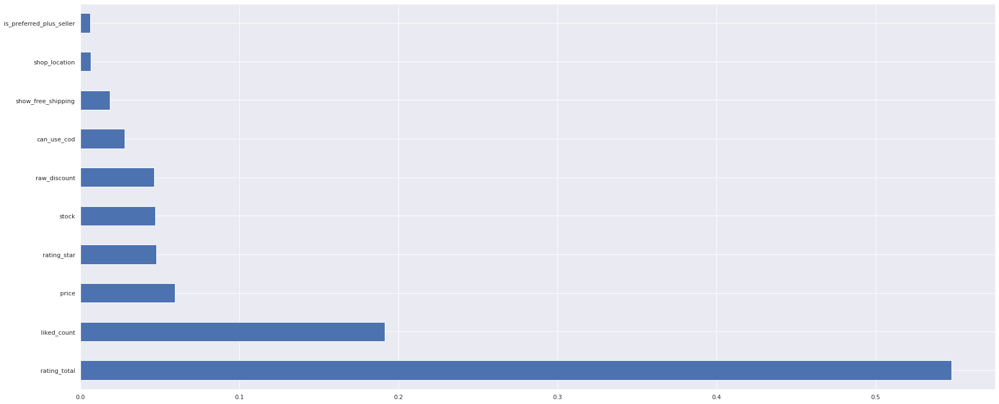

In [95]:
import pandas as pd
import numpy as np
y = df['historical_sold']
X = df.drop('historical_sold',axis=1) 
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.show()

Dengan menggunakan package ExtraTreesClassifier, SelectKBest menggunakan metode chi2, serta analissi korelasi, didapatkan pemilihan feature terbaik sebagai berikut, yakni enam variabel kuantitatif **('stock', 'liked_count', 'rating_total', 'price','raw_discount', 'rating_star')**


In [96]:
print(df.keys())

Index(['stock', 'historical_sold', 'liked_count', 'rating_total', 'price',
       'raw_discount', 'rating_star', 'show_free_shipping',
       'is_preferred_plus_seller', 'shop_location', 'can_use_cod',
       'is_on_flash_sale'],
      dtype='object')


In [97]:
#Penghapusn variabel yang tidak termasuk dalam fetaure best selection
df = df.drop(['show_free_shipping','is_preferred_plus_seller', 'shop_location', 'can_use_cod','is_on_flash_sale'],axis=1)
print(df.keys())

Index(['stock', 'historical_sold', 'liked_count', 'rating_total', 'price',
       'raw_discount', 'rating_star'],
      dtype='object')


# **C Split Data Testing dan Data Training**

In [98]:
#Split dataset menjadi data tesing dan data training
X_train, X_test, y_train, y_test = train_test_split(x_tr,y,test_size=0.30)

# **D. Fix Imbalanced Data with SMOTE**

In [99]:
from collections import Counter
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, roc_auc_score
import pandas as pd
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [100]:
#Menggunakan metode SMOTE Oversampling
SMOTE = SMOTE()
X_train_SMOTE, y_train_SMOTE = SMOTE.fit_resample(X_train, y_train)

print("Before oversampling SMOTE: ",Counter(y_train))
print("After oversampling SMOTE: ",Counter(y_train_SMOTE))

Before oversampling SMOTE:  Counter({0: 1643, 1: 471, 2: 266})
After oversampling SMOTE:  Counter({0: 1643, 2: 1643, 1: 1643})


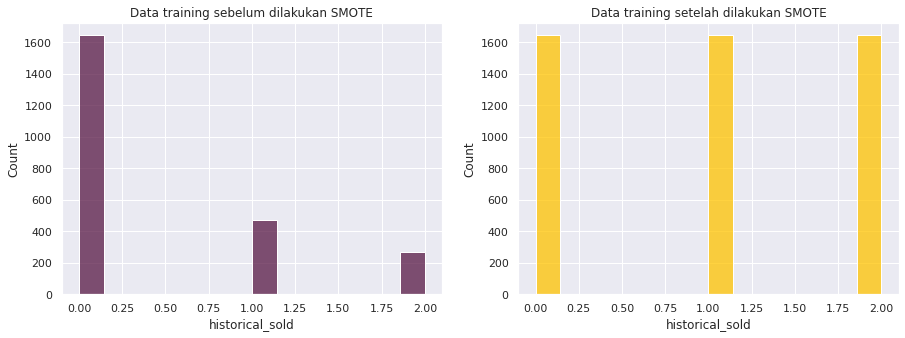

In [101]:
#Perbandingan data training sebelum dan sesudah dilakukan oversampling
plt.figure(figsize=(15,5)) 
plt.subplot(1,2,1)                                                                                                
sns.histplot(y_train,color = "#581845")
plt.title('Data training sebelum dilakukan SMOTE')
plt.subplot(1,2,2)
sns.histplot(y_train_SMOTE,color = '#FFC300')
plt.title('Data training setelah dilakukan SMOTE')
plt.show()

**INTERPRETASI**

1. **Before oversampling SMOTE:**  ({0: 1643, 1: 471, 2: 266})

   **After oversampling SMOTE:**  ({0: 1643, 2: 1643, 1: 1643})

2. Karena jumlah data antar label 0 dengan label 1 dan 2 cukup jauh berbeda, maka dilakukan penanganan imbalanced data dengan metode **oversampling**, dimana oversampling dilakukan dengan menduplikasi atau membuat contoh sintetis baru pada kelas dengan jumlah data minoritas (label 1 dan 2). Sehingga, tidak menghapus informasi yang berguna pada kelas mayoritas (label 0)


# **E. Model Classification After SMOTE**

##**1. Decision Tree**

In [102]:
model_performance = pd.DataFrame(columns=['Accuracy','Sensitivity', 'Specificity', 'Precision','F1-Score'])

In [103]:
from sklearn.tree import DecisionTreeClassifier

modeltree = DecisionTreeClassifier(max_depth=4).fit(X_train_SMOTE,y_train_SMOTE)
pred_SMOTE_dc = modeltree.predict(X_test)

print('Training set score: {:.2f}'.format(modeltree.score(X_train_SMOTE, y_train_SMOTE)))
print('Test set score: {:.2f}'.format(modeltree.score(X_test, y_test)))

cnf_matrix = confusion_matrix(y_test, pred_SMOTE_dc)
print("Confusion Matrix for Decision Tree Classifier:")
print(cnf_matrix)

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
print("\nClassification Report for Decision Tree Classifier:\n%s"%classification_report(y_test,pred_SMOTE_dc))

Training set score: 0.97
Test set score: 0.97
Confusion Matrix for Decision Tree Classifier:
[[707  12   0]
 [ 15 170   5]
 [  0   2 110]]

Classification Report for Decision Tree Classifier:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98       719
           1       0.92      0.89      0.91       190
           2       0.96      0.98      0.97       112

    accuracy                           0.97      1021
   macro avg       0.95      0.95      0.95      1021
weighted avg       0.97      0.97      0.97      1021



In [104]:
FP = (cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)).astype(float)
FN = (cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)).astype(float)
TP = (np.diag(cnf_matrix)).astype(float)
TN = (cnf_matrix.sum() - (FP + FN + TP)).astype(float)

accuracy = accuracy_score(y_test, pred_SMOTE_dc)
sensitivity = recall_score(y_test, pred_SMOTE_dc, average='weighted')
specificity_raw = TN/(TN+FP)
specificity = 0
for i in specificity_raw:
  specificity += i
specificity /= 3
precision = precision_score(y_test, pred_SMOTE_dc, average='weighted')
f1s = f1_score(y_test, pred_SMOTE_dc, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(sensitivity))
print("Specificity: "+ "{:.2%}".format(specificity))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))

model_performance.loc['Decision Tree'] = [accuracy, sensitivity, specificity, precision, f1s]

Accuracy: 96.67%
Recall: 96.67%
Specificity: 97.60%
Precision: 96.64%
F1-Score: 96.65%


##**2. Gaussian Naive Bayes**

In [114]:
from sklearn.naive_bayes import GaussianNB

modelngb = GaussianNB()
modelngb.fit(X_train_SMOTE, y_train_SMOTE)
pred_SMOTE_gnb = modelngb.predict(X_test)

print('Training set score: {:.2f}'.format(modelngb.score(X_train_SMOTE, y_train_SMOTE)))
print('Test set score: {:.2f}'.format(modelngb.score(X_test, y_test)))

cnf_matrix2 = confusion_matrix(y_test, pred_SMOTE_gnb)
print("Confusion Matrix for Gaussian Naive Bayes Classifier:")
print(cnf_matrix2)

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
k_value5_accuracy_score=accuracy_score(y_test, pred_SMOTE_gnb)
print("\nClassification Report for Gaussian Naive Bayes Classifier:\n%s"%classification_report(y_test, pred_SMOTE_gnb))

Training set score: 0.88
Test set score: 0.88
Confusion Matrix for Gaussian Naive Bayes Classifier:
[[649  69   1]
 [ 21 144  25]
 [  1   6 105]]

Classification Report for Gaussian Naive Bayes Classifier:
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       719
           1       0.66      0.76      0.70       190
           2       0.80      0.94      0.86       112

    accuracy                           0.88      1021
   macro avg       0.81      0.87      0.83      1021
weighted avg       0.89      0.88      0.88      1021



In [115]:
FP = (cnf_matrix2.sum(axis=0) - np.diag(cnf_matrix2)).astype(float)
FN = (cnf_matrix2.sum(axis=1) - np.diag(cnf_matrix2)).astype(float)
TP = (np.diag(cnf_matrix2)).astype(float)
TN = (cnf_matrix2.sum() - (FP + FN + TP)).astype(float)

accuracy = accuracy_score(y_test, pred_SMOTE_gnb)
sensitivity = recall_score(y_test, pred_SMOTE_gnb, average='weighted')
specificity_raw = TN/(TN+FP)
specificity = 0
for i in specificity_raw:
  specificity += i
specificity /= 3
precision = precision_score(y_test, pred_SMOTE_gnb, average='weighted')
f1s = f1_score(y_test, pred_SMOTE_gnb, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(sensitivity))
print("Specificity: "+ "{:.2%}".format(specificity))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))

model_performance.loc['Gaussian Naive Bayes'] = [accuracy, sensitivity, specificity, precision, f1s]

Accuracy: 87.95%
Recall: 87.95%
Specificity: 93.61%
Precision: 89.14%
F1-Score: 88.34%


##**3. KNN (K-Nearest Neighbour)**

In [107]:
from sklearn.neighbors import KNeighborsClassifier

modelknn = KNeighborsClassifier(n_neighbors=6)
modelknn.fit(X_train_SMOTE, y_train_SMOTE)
pred_SMOTE_knn = modelknn.predict(X_test)

print('Training set score: {:.2f}'.format(modelknn.score(X_train_SMOTE, y_train_SMOTE)))
print('Test set score: {:.2f}'.format(modelknn.score(X_test, y_test)))

cnf_matrix3 = confusion_matrix(y_test, pred_SMOTE_knn)
print("Confusion Matrix for K-Nearest Neighbor Classifier:")
print(cnf_matrix3)

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
k_value5_accuracy_score=accuracy_score(y_test, pred_SMOTE_knn)
print("\nClassification Report for K-Nearest Neighbor Classifier:\n%s"%classification_report(y_test, pred_SMOTE_knn))

Training set score: 0.97
Test set score: 0.92
Confusion Matrix for K-Nearest Neighbor Classifier:
[[675  42   2]
 [ 32 152   6]
 [  0   3 109]]

Classification Report for K-Nearest Neighbor Classifier:
              precision    recall  f1-score   support

           0       0.95      0.94      0.95       719
           1       0.77      0.80      0.79       190
           2       0.93      0.97      0.95       112

    accuracy                           0.92      1021
   macro avg       0.89      0.90      0.89      1021
weighted avg       0.92      0.92      0.92      1021



In [108]:
FP = (cnf_matrix3.sum(axis=0) - np.diag(cnf_matrix3)).astype(float)
FN = (cnf_matrix3.sum(axis=1) - np.diag(cnf_matrix3)).astype(float)
TP = (np.diag(cnf_matrix3)).astype(float)
TN = (cnf_matrix3.sum() - (FP + FN + TP)).astype(float)

accuracy = accuracy_score(y_test, pred_SMOTE_knn)
sensitivity = recall_score(y_test, pred_SMOTE_knn, average='weighted')
specificity_raw = TN/(TN+FP)
specificity = 0
for i in specificity_raw:
  specificity += i
specificity /= 3
precision = precision_score(y_test, pred_SMOTE_knn, average='weighted')
f1s = f1_score(y_test, pred_SMOTE_knn, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(sensitivity))
print("Specificity: "+ "{:.2%}".format(specificity))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))

model_performance.loc['K-Nearest Neighbor'] = [accuracy, sensitivity, specificity, precision, f1s]

Accuracy: 91.67%
Recall: 91.67%
Specificity: 94.37%
Precision: 91.81%
F1-Score: 91.73%


##**4. SVM (Support Vector Machine)**

In [109]:
from sklearn.svm import SVC

modelsvm = SVC()
modelsvm.fit(X_train_SMOTE, y_train_SMOTE)
pred_SMOTE_svm = modelsvm.predict(X_test)

print('Training set score: {:.2f}'.format(modelknn.score(X_train_SMOTE, y_train_SMOTE)))
print('Test set score: {:.2f}'.format(modelknn.score(X_test, y_test)))

cnf_matrix4 = confusion_matrix(y_test, pred_SMOTE_svm)
print("Confusion Matrix for Support Vector Machine Classifier:")
print(cnf_matrix4)

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
k_value5_accuracy_score=accuracy_score(y_test, pred_SMOTE_svm)
print("\nClassification Report for Support Vector Machine Classifier:\n%s"%classification_report(y_test, pred_SMOTE_svm))

Training set score: 0.97
Test set score: 0.92
Confusion Matrix for Support Vector Machine Classifier:
[[700  19   0]
 [ 82  97  11]
 [  1   6 105]]

Classification Report for Support Vector Machine Classifier:
              precision    recall  f1-score   support

           0       0.89      0.97      0.93       719
           1       0.80      0.51      0.62       190
           2       0.91      0.94      0.92       112

    accuracy                           0.88      1021
   macro avg       0.86      0.81      0.82      1021
weighted avg       0.88      0.88      0.87      1021



In [110]:
FP = (cnf_matrix4.sum(axis=0) - np.diag(cnf_matrix4)).astype(float)
FN = (cnf_matrix4.sum(axis=1) - np.diag(cnf_matrix4)).astype(float)
TP = (np.diag(cnf_matrix4)).astype(float)
TN = (cnf_matrix4.sum() - (FP + FN + TP)).astype(float)

accuracy = accuracy_score(y_test, pred_SMOTE_svm)
sensitivity = recall_score(y_test, pred_SMOTE_svm, average='weighted')
specificity_raw = TN/(TN+FP)
specificity = 0
for i in specificity_raw:
  specificity += i
specificity /= 3
precision = precision_score(y_test, pred_SMOTE_svm, average='weighted')
f1s = f1_score(y_test, pred_SMOTE_svm, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(sensitivity))
print("Specificity: "+ "{:.2%}".format(specificity))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))

model_performance.loc['Support Vector Machine'] = [accuracy, sensitivity, specificity, precision, f1s]

Accuracy: 88.34%
Recall: 88.34%
Specificity: 89.43%
Precision: 87.68%
F1-Score: 87.31%


##**5. Random Forest**

In [111]:
from sklearn.ensemble import RandomForestClassifier

modelrf = RandomForestClassifier(ccp_alpha=0.05)
modelrf.fit(X_train_SMOTE, y_train_SMOTE)
pred_SMOTE_rf = modelrf.predict(X_test)

print('Training set score: {:.2f}'.format(modelrf.score(X_train_SMOTE, y_train_SMOTE)))
print('Test set score: {:.2f}'.format(modelrf.score(X_test, y_test)))

cnf_matrix5 = confusion_matrix(y_test, pred_SMOTE_rf)
print("Confusion Matrix for Random Forest Classifier:")
print(cnf_matrix5)

from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
k_value5_accuracy_score=accuracy_score(y_test, pred_SMOTE_rf)
print("\nClassification Report for Random Forest Classifier:\n%s"%classification_report(y_test, pred_SMOTE_rf))

Training set score: 0.94
Test set score: 0.95
Confusion Matrix for Random Forest Classifier:
[[692  27   0]
 [ 21 165   4]
 [  0   4 108]]

Classification Report for Random Forest Classifier:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97       719
           1       0.84      0.87      0.85       190
           2       0.96      0.96      0.96       112

    accuracy                           0.95      1021
   macro avg       0.93      0.93      0.93      1021
weighted avg       0.95      0.95      0.95      1021



In [112]:
FP = (cnf_matrix5.sum(axis=0) - np.diag(cnf_matrix5)).astype(float)
FN = (cnf_matrix5.sum(axis=1) - np.diag(cnf_matrix5)).astype(float)
TP = (np.diag(cnf_matrix5)).astype(float)
TN = (cnf_matrix5.sum() - (FP + FN + TP)).astype(float)

accuracy = accuracy_score(y_test, pred_SMOTE_rf)
sensitivity = recall_score(y_test, pred_SMOTE_rf, average='weighted')
specificity_raw = TN/(TN+FP)
specificity = 0
for i in specificity_raw:
  specificity += i
specificity /= 3
precision = precision_score(y_test, pred_SMOTE_rf, average='weighted')
f1s = f1_score(y_test, pred_SMOTE_rf, average='weighted')

print("Accuracy: "+ "{:.2%}".format(accuracy))
print("Recall: "+ "{:.2%}".format(sensitivity))
print("Specificity: "+ "{:.2%}".format(specificity))
print("Precision: "+ "{:.2%}".format(precision))
print("F1-Score: "+ "{:.2%}".format(f1s))

model_performance.loc['Random Forest'] = [accuracy, sensitivity, specificity, precision, f1s]

Accuracy: 94.52%
Recall: 94.52%
Specificity: 96.29%
Precision: 94.59%
F1-Score: 94.55%


#**F. Perbandingan Ukuran Performa Model Klasifikasi**

In [113]:
model_performance.style.background_gradient(cmap='RdYlBu_r').format({'Accuracy': '{:.2%}',
                                                                    'Sensitivity': '{:.2%}',
                                                                    'Specificity': '{:.2%}',
                                                                    'Precision': '{:.2%}',
                                                                    'F1-Score': '{:.2%}',
                                                                    })

,Accuracy,Sensitivity,Specificity,Precision,F1-Score
Decision Tree,96.67%,96.67%,97.60%,96.64%,96.65%
Gaussian Naive Bayes,87.95%,87.95%,93.61%,89.14%,88.34%
K-Nearest Neighbor,91.67%,91.67%,94.37%,91.81%,91.73%
Support Vector Machine,88.34%,88.34%,89.43%,87.68%,87.31%
Random Forest,94.52%,94.52%,96.29%,94.59%,94.55%


*(seluruh interpretasi model klasifikasi, dipaparkan di laporan)



<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=2d6ef118-e74c-4a42-bcb3-4ef5dad4e2f1' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>